In [5]:
import pandas as pd
import numpy as np
import pickle
import plotly.graph_objects as go
import datetime
import plotly.graph_objects as go

In [6]:
actual_item = '30m-item76'

In [7]:
df = pickle.load( open( "/home/richard_stana/programing/clanok/data/picklnute/30min.p", "rb" ) )

In [17]:
df.index

Int64Index([    0,     1,     2,     3,     4,     5,     6,     7,     8,
                9,
            ...
            17463, 17464, 17465, 17466, 17467, 17468, 17469, 17470, 17471,
            17472],
           dtype='int64', length=17473)

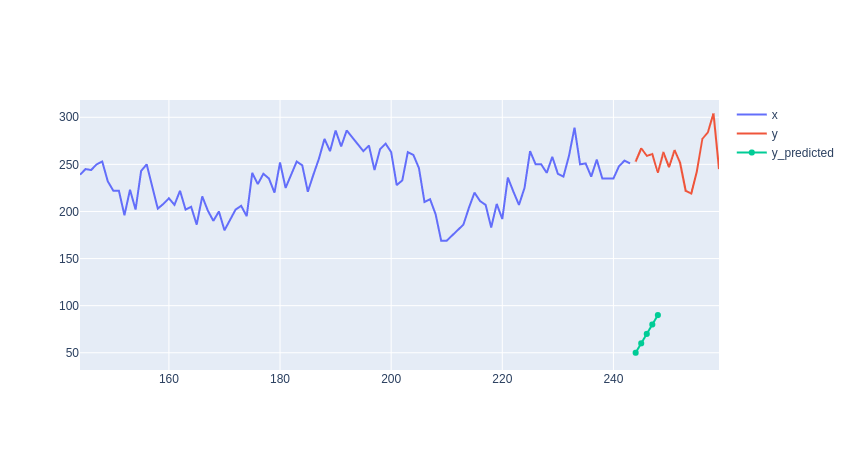

In [36]:
draw_multistep(df[actual_item][144:244],df[actual_item][244:260],[50,60,70,80,90])

In [198]:
casy = pd.read_csv("casy.csv")
df["Date Time"]=casy

In [199]:
date_time = pd.to_datetime(df.pop('Date Time'), format='%d.%m.%Y %H:%M:%S')

In [200]:
datetime_series = pd.to_datetime(date_time)
datetime_index = pd.DatetimeIndex(datetime_series.values)
df=df.set_index(datetime_index)
type(df)

pandas.core.frame.DataFrame

In [201]:
arrays = [list(range(52417)), list(df.index )]


index = pd.MultiIndex.from_tuples(list(zip(*arrays)), names=["cislo", "datum"])
aa = pd.DataFrame(df.values, index=index)
aa.columns = df.columns
df = aa

In [23]:
type(df[actual_item])

pandas.core.series.Series

In [31]:
def draw_multistep(x, y=None, y_pred=None):
    fig = go.Figure()
    x_index = x.index
    fig.add_trace(go.Scatter(x=x_index, y=x,
                            mode='lines',
                            name='x'))
    if y is not None:
        y_index = y.index
        fig.add_trace(go.Scatter(x=y_index, y=y,
                            mode='lines',
                            name='y'))
    if y_pred is not None:
        fig.add_trace(go.Scatter(x=y_index, y=y_pred,
                            mode='lines+markers',
                            name='y_predicted'))
    fig.show()


In [182]:
def draw(x, y1_orig=None, y2_Percentage=None, y3_Log=None):
    fig = go.Figure()
    x1 = x.index.get_level_values("datum")
    if y1_orig is not None:
        fig.add_trace(go.Scatter(x=x1, y=y1_orig,
                            mode='lines',
                            name='orig'))
    if y2_Percentage is not None:
        fig.add_trace(go.Scatter(x=x1, y=y2_Percentage,
                            mode='lines+markers',
                            name='predicted'))

    fig.show()

In [59]:
from plotly.subplots import make_subplots
def draw_more(title_text, names, y, x=None, y_pred=None):
    fig = make_subplots(rows=len(y), cols=1, subplot_titles=names)
    for i in range(len(y)):
        if y_pred is not None:
            x_index = x[i].index
            fig.append_trace(go.Scatter(
                x=x_index,
                y=x[i],
                name='orig',
                line_color='blue'
            ), row=i+1, col=1)
        y_index = y[i].index
        fig.append_trace(go.Scatter(
            x=y_index,
            y=y[i],
            name='orig',
            line_color='blue'
        ), row=i+1, col=1)
        if y_pred is not None:
            fig.append_trace(go.Scatter(
                x=y_index,
                y=y_pred[i],
                name='pred',
                line_color='red'
            ), row=i+1, col=1)
        
    fig.update_layout(height=600, width=600, title_text=title_text)
    fig.show()

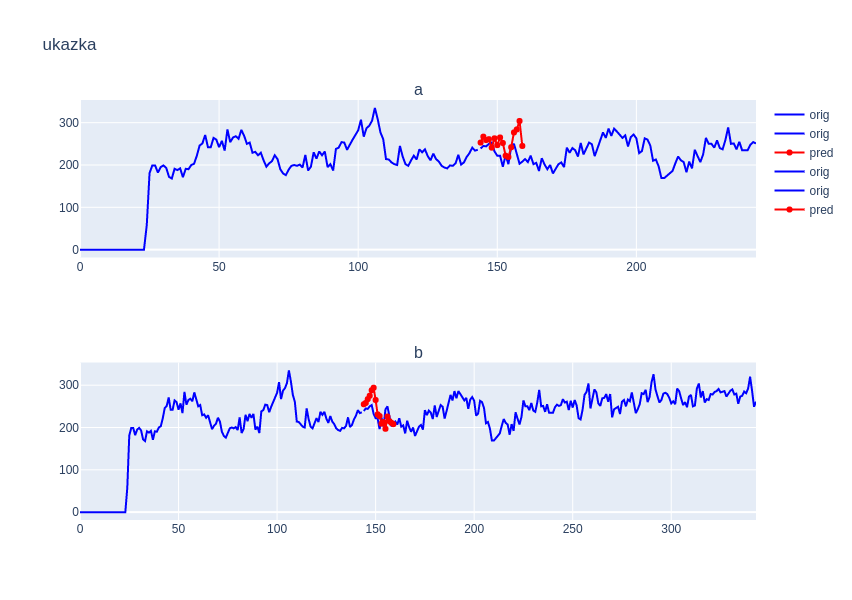

In [58]:
draw_more("ukazka", names=("a", "b"), y=[df[actual_item][144:244], df[actual_item][144:344]], x=[df[actual_item][0:144], df[actual_item][0:144]], y_pred= [df[actual_item][244:260], df[actual_item][344:360]])

In [244]:
def create_percentage_change(df, alfa=1):
    df1 = df.copy()
    df1 = df1.drop(df1.index[0])
    df1 = df1.iloc[:,:]-df.iloc[:-1,:].values
    df1 = df1.iloc[:,:]/(df.iloc[:-1,:].values + alfa)
    return df1

In [245]:
def create_log_difference(df, alfa=1):
    df1 = df.copy()
    df1 = df1.drop(df1.index[0])
    
    df1 = np.log( (df1 + alfa) / (df.iloc[:-1,:].values + alfa) )
    
    return df1

In [250]:
def back_from_percentage_change(df, pred, alfa=1):
    return pred*(df + alfa)+df

In [262]:
def back_from_log_difference(df, pred, alfa=1):
    return np.e**(pred + np.log(df + alfa))-alfa

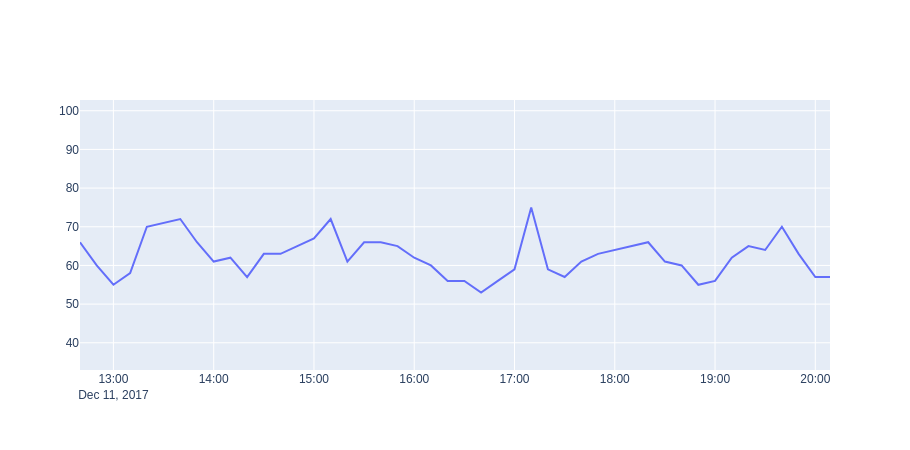

In [234]:
draw(df.index.get_level_values("datum"), df[actual_item])

In [205]:
# 75-41750, 
df = df.iloc[75:41750]

In [246]:
df_percentage_change = create_percentage_change(df, 1)

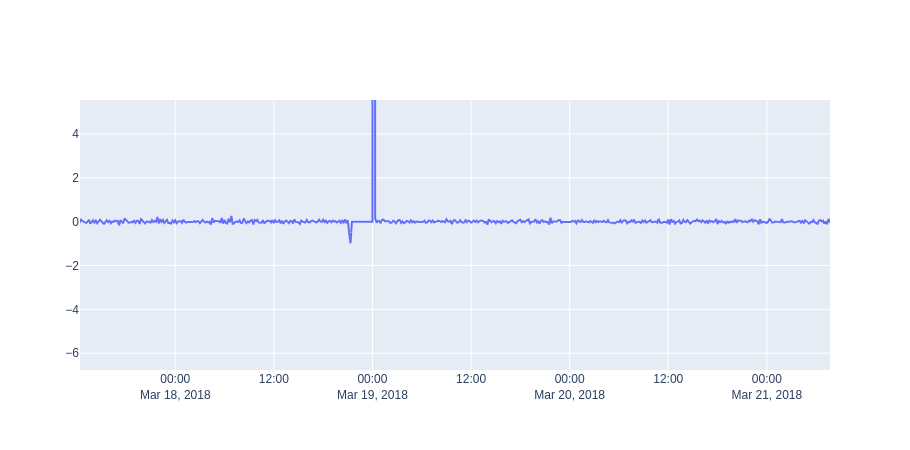

In [247]:
draw(df_percentage_change.index.get_level_values("datum"), df_percentage_change[actual_item])

In [248]:
df_log_difference = create_log_difference(df, 1)

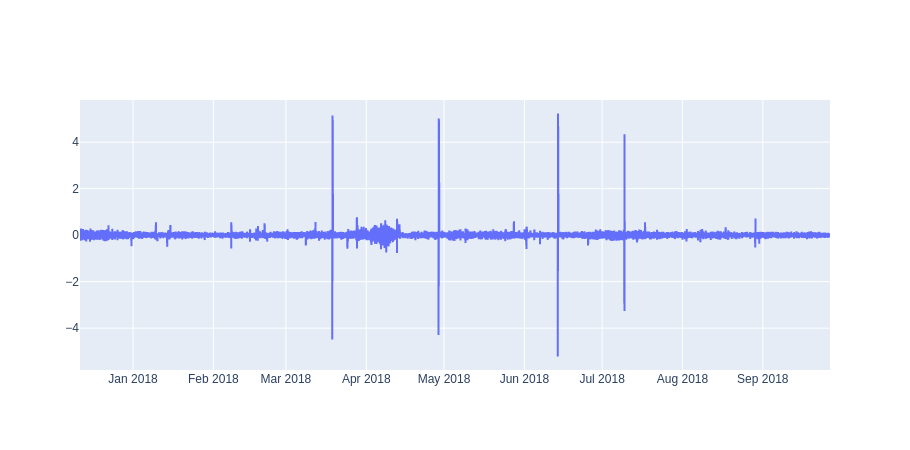

In [249]:
draw(df_log_difference.index.get_level_values("datum"), df_log_difference[actual_item])

In [254]:
orig_from_percentage_change = back_from_percentage_change(df[actual_item].values[:-1], df_percentage_change[actual_item])

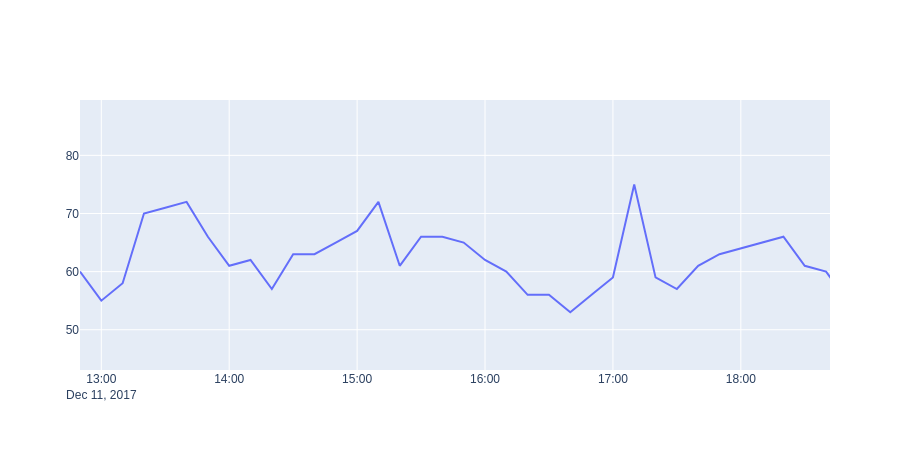

In [256]:
draw(orig_from_percentage_change.index.get_level_values("datum"), orig_from_percentage_change)

In [266]:
orig_from_log_difference = back_from_log_difference(df[actual_item].values[:-1], df_log_difference[actual_item])

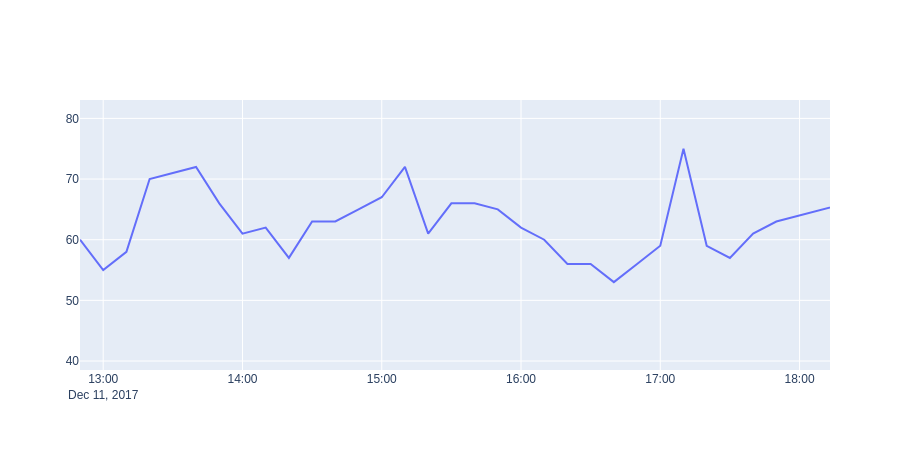

In [267]:
draw(orig_from_percentage_change.index.get_level_values("datum"), orig_from_log_difference)

In [69]:
def create_x_y(df, item, input_length, output_length):
    X, y = list(), list()
    for i in range(df):
        # find the end of this pattern
        id_x = i + input_length
        id_y = i + input_length + output_length
        # check if we are beyond the sequence
        if id_y > len(df)-1:
            break
        # gather input and output parts of the pattern
        seq_x, seq_y = df[i:id_x], df[id_x:id_y]
        X.append(seq_x)
        y.append(seq_y)
    
    return np.array(X), np.array(y), X, y

In [58]:
df[actual_item][:50]

0       0
1       0
2       0
3       0
4       0
5       0
6       0
7       0
8       0
9       0
10      0
11      0
12      0
13      0
14      0
15      0
16      0
17      0
18      0
19      0
20      0
21      0
22      0
23      0
24     58
25    181
26    199
27    199
28    182
29    195
30    199
31    193
32    172
33    168
34    191
35    188
36    192
37    171
38    191
39    190
40    200
41    203
42    222
43    246
44    251
45    271
46    242
47    242
48    264
49    260
Name: 30m-item76, dtype: int64